In [1]:
# OPTIONAL: Load the "autoreload" extension so that code can change
%load_ext autoreload

# OPTIONAL: always reload modules so that as you change code in src, it gets loaded
%autoreload 2

%matplotlib inline

In [2]:
import os, sys
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
sys.path.append("/home/Developer/NCSN-TF2.0/")

import PIL
import utils, configs
import argparse
import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
import matplotlib.pyplot as plt

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
from helper import plot_confusion_matrix, metrics

from datasets.dataset_loader import  *
from tqdm import tqdm
from sklearn.metrics import classification_report, average_precision_score
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc

from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

from PIL import Image
from IPython.display import display
from matplotlib.pyplot import imshow
from datetime import datetime

import seaborn as sns
import plotly as py
import plotly.graph_objs as go

sns.set(style="darkgrid")
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 16

seed=42
tf.random.set_seed(seed)
np.random.seed(seed)

tf.__version__

'2.2.0'

In [3]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.config.experimental.list_physical_devices('GPU')

Num GPUs Available:  1


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

In [5]:
def get_command_line_args(_args):
    parser = utils._build_parser()

    parser = parser.parse_args(_args)

    utils.check_args_validity(parser)

    print("=" * 20 + "\nParameters: \n")
    for key in parser.__dict__:
        print(key + ': ' + str(parser.__dict__[key]))
    print("=" * 20 + "\n")
    return parser

In [6]:
def metrics(inlier_score, outlier_score, plot=False, verbose=False):
    import numpy as np
    from sklearn.metrics import roc_curve
    from sklearn.metrics import classification_report, average_precision_score
    from sklearn.metrics import roc_auc_score, precision_recall_curve, auc
    
    y_true = np.concatenate((np.zeros(len(inlier_score)),
                             np.ones(len(outlier_score))))
    y_scores = np.concatenate((inlier_score, outlier_score))
    
    prec,rec,thresh = precision_recall_curve(y_true, y_scores)
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    
    roc_auc = roc_auc_score(y_true,y_scores)
    pr_auc = auc(rec,prec)
    ap = average_precision_score(y_true,y_scores)
    
    if plot:    
    
        fig, axs = plt.subplots(1,2, figsize=(16,4))

        sns.lineplot(fpr, tpr, ax=axs[0])
        axs[0].set(
            xlabel="FPR", ylabel="TPR", title="ROC"
        )

        sns.lineplot(rec, prec, ax=axs[1])
        axs[1].set(
            xlabel="Recall", ylabel="Precision", title="Precision-Recall"
        )

        plt.show()
        plt.close()
    
    if verbose:
        print("Inlier vs Outlier")
        print("----------------")
        print("ROC-AUC: {:.4f}".format(roc_auc))
        print("PR-AUC: {:.4f}".format(pr_auc))
        print("Avg Prec: {:.4f}".format(ap))
        
    return roc_auc, ap, pr_auc

In [10]:
from scipy.ndimage import uniform_filter, median_filter

#Smooth first to get rid of spurious outliers
def preproc(x, orig=None):
    x = np.abs(uniform_filter(x, size=3))
    
    # Only consider foreground pixels
#     x = x[orig>0]
    return x

# Selecting Quantile for best separation
def getQuantiles(logits,orig, Q=0.95):    
    quants = [np.quantile(preproc(x,o), Q) for x,o in zip(logits, orig)]
    quants = np.array(quants).reshape(-1,1)
    return quants

In [11]:
TEST_BATCH = 1000

@tf.function
def preproc(x):
    x = tf.image.rgb_to_grayscale(x)
    x = tf.image.resize(x, size=[28,28])
    return x

with tf.device('CPU'):
    # load dataset from tfds (or use downloaded version if exists)
    fashion_test_ = get_train_test_data("fashion_mnist")[1]
    fashion_test_ = fashion_test_.shuffle(100000).batch(TEST_BATCH)

    fashion_test_batches = [x for x in fashion_test_]

In [13]:
fashion_train = fashion_test_batches[0:5]
fashion_test = fashion_test_batches[:]
# len(fashion_train), len(fashion_test)

In [68]:
# with tf.device('CPU'):
#     # load dataset from tfds (or use downloaded version if exists)
#     fashion_train = get_train_test_data("fashion_mnist")[0]
#     fashion_train = fashion_train.shuffle(100000).cache().batch(1000).take(60)
# fashion_test = fashion_test_batches

In [14]:
with tf.device('CPU'):
    mnist_test = get_train_test_data("mnist")[1]
    mnist_test = mnist_test.shuffle(10000).batch(TEST_BATCH)
    mnist_test = mnist_test.cache()

    cifar_test = get_train_test_data("cifar10")[1]
    cifar_test = cifar_test.map(preproc)
    cifar_test = cifar_test.shuffle(10000).batch(TEST_BATCH)
    cifar_test = cifar_test.cache()

## Generating Samples

In [15]:
args = get_command_line_args(["--checkpoint_dir=longleaf_models/",
                              "--filters=64",
                              "--dataset=fashion_mnist",
                              "--sigma_low=0.01",
                              "--sigma_high=1"
                             ])
configs.config_values = args

BEST_SIGMA_IDX = configs.config_values.num_L - 1
SIGMAS = utils.get_sigma_levels().numpy()
SIGMAS

Parameters: 

experiment: train
dataset: fashion_mnist
model: refinenet
filters: 64
num_L: 10
sigma_low: 0.01
sigma_high: 1.0
sigma_sequence: geometric
steps: 200000
learning_rate: 0.001
batch_size: 128
samples_dir: ./samples/
checkpoint_dir: longleaf_models/
checkpoint_freq: 5000
resume: True
resume_from: -1
init_samples: 
k: 10
eval_setting: sample
ocnn: False
y_cond: False
max_to_keep: 2



array([1.        , 0.5994842 , 0.35938135, 0.21544345, 0.12915495,
       0.07742635, 0.04641588, 0.02782559, 0.016681  , 0.01      ],
      dtype=float32)

In [16]:
utils.get_savemodel_dir()

('longleaf_models/refinenet64_fashion_mnist_L10_SH1e+00_SL1e-02/',
 'refinenet64_fashion_mnist_L10_SH1e+00_SL1e-02')

In [17]:
save_dir, complete_model_name = utils.get_savemodel_dir() # "longleaf_models/baseline64_fashion_mnist_SL0.001", ""
fashion_model, optimizer, step, _, _ = utils.try_load_model(save_dir,
                                              step_ckpt=configs.config_values.resume_from,
                                              verbose=True)

(1, 28, 28, 1)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
images (InputLayer)             [(None, 28, 28, 1)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 28, 28, 64)   640         images[0][0]                     
__________________________________________________________________________________________________
idx_sigmas (InputLayer)         [(None,)]            0                                            
__________________________________________________________________________________________________
conditional_full_pre_activation (None, 28, 28, 64)   77696       conv2d[0][0]                     
                                                                 idx_sigmas[0][

### Getting Score Distributions

In [18]:
%%time

idx_sigmas = tf.ones(TEST_BATCH,dtype=tf.int32) * BEST_SIGMA_IDX

for fashion_,mnist_,cifar_ in zip(fashion_test,mnist_test,cifar_test):
    fashion_logits = fashion_model([fashion_, idx_sigmas])
    mnist_logits = fashion_model([mnist_, idx_sigmas])
    cifar_logits = fashion_model([cifar_, idx_sigmas])

CPU times: user 11.9 s, sys: 14 s, total: 25.9 s
Wall time: 21.3 s


In [49]:
# L2-norm same as Frobenius
f_train_fashion_score = tf.norm(fashion_logits, axis=[1,2], ord="euclidean").numpy()
f_train_mnist_score = tf.norm(mnist_logits, axis=[1,2], ord="euclidean").numpy()
f_train_cifar_score = tf.norm(cifar_logits, axis=[1,2], ord="euclidean").numpy()

In [50]:
df = pd.DataFrame(np.hstack((f_train_fashion_score,
                             f_train_mnist_score,
                             f_train_cifar_score)),
             columns=["Fashion", "MNIST", "Cifar"])
df.describe()

,Fashion,MNIST,Cifar
count,1000.000000,1000.000000,1000.000000
mean,818.417297,756.922180,1999.237305
std,222.825256,146.556381,280.459076
min,267.049316,313.915955,819.604858
25%,652.983200,664.996429,1850.752533
50%,797.557587,766.610138,2036.967957
75%,991.397980,859.774582,2201.484070
max,1584.942627,1180.907715,2587.406494


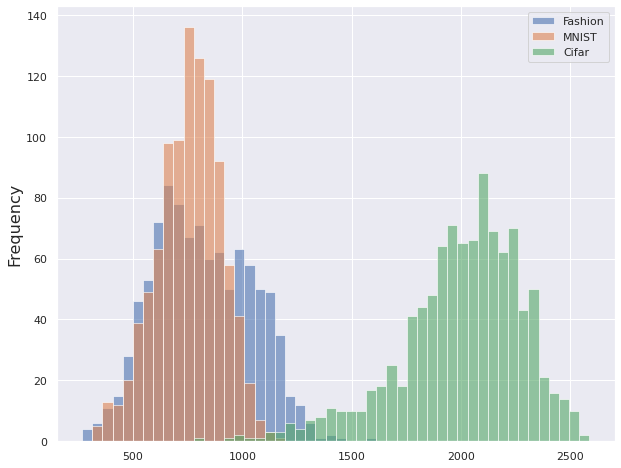

In [51]:
df.plot(kind="hist", bins=50, alpha=0.6, figsize=(10,8))

### Fashion vs MNIST

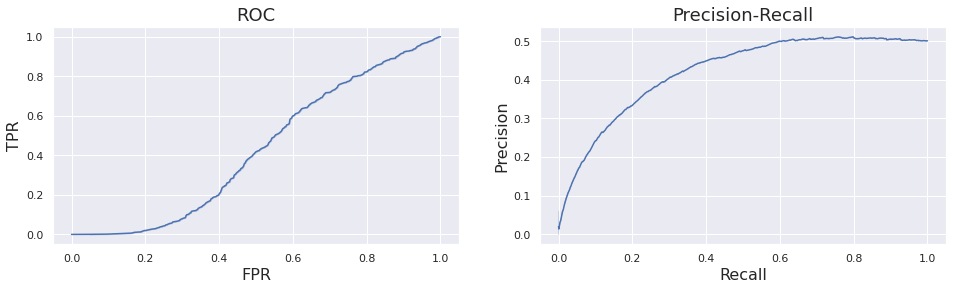

Inlier vs Outlier
----------------
ROC-AUC: 0.4275
PR-AUC: 0.4214
Avg Prec: 0.4219


In [58]:
metrics(f_train_fashion_score, f_train_mnist_score, plot=True, verbose=True)
plt.show()

In [19]:
def compute_scores(x_test):
    
    # Sigma Idx -> Score
    score_dict = []
    
    sigmas = utils.get_sigma_levels().numpy()
    final_logits = 0 #tf.zeros(logits_shape)
    progress_bar = tqdm(SIGMAS, desc='Sigma: ?')
    for idx, sigma in enumerate(progress_bar):
        
        progress_bar.set_description("Sigma: {:.4f}".format(sigma))
        _logits =[]

        for x_batch in x_test:
            idx_sigmas = tf.ones(x_batch.shape[0], dtype=tf.int32) * idx
            score = fashion_model([x_batch, idx_sigmas])
#             x_batch, y_cond = tf.split(x_batch, SPLITS, axis=-1)
#             score = tf.where(x_batch > 1e-10, score,  0)
            _logits.append(score)

        _logits = tf.concat(_logits, axis=0)
        score_dict.append(tf.identity(_logits))
        
#         final_logits += _logits * sigma
    
    return score_dict

In [20]:
LABELS = np.array(["Train", "Fashion", "MNIST", "CIFAR"])
colors = ["red", "blue", "green", "orange"]

In [17]:
%%time
fashion_train_dist = compute_scores(fashion_train)

Sigma: 0.0100: 100%|██████████| 10/10 [00:35<00:00,  3.55s/it]

CPU times: user 14.3 s, sys: 5.98 s, total: 20.3 s
Wall time: 35.5 s


In [21]:
%%time
# fashion_train_dist = compute_scores(fashion_train)
fashion_dist = compute_scores(fashion_test)

Sigma: 0.0100: 100%|██████████| 10/10 [01:03<00:00,  6.37s/it]

CPU times: user 27.8 s, sys: 8.63 s, total: 36.4 s
Wall time: 1min 3s


In [22]:
%%time
mnist_dist = compute_scores(mnist_test)
cifar_dist = compute_scores(cifar_test)

Sigma: 0.0100: 100%|██████████| 10/10 [01:05<00:00,  6.51s/it]

CPU times: user 1min, sys: 1min 10s, total: 2min 11s
Wall time: 2min 9s


In [75]:
fashion_train_dist[0].shape, fashion_dist[0].shape

(TensorShape([60000, 28, 28, 1]), TensorShape([10000, 28, 28, 1]))

In [76]:
# L2-norm same as Frobenius
train_agg = tf.add_n([fashion_train_dist[x] * s for x, s in enumerate(SIGMAS)])
inlier_agg = tf.add_n([fashion_dist[x] * s for x, s in enumerate(SIGMAS)])
outlier_agg = tf.add_n([mnist_dist[x] * s for x,s in enumerate(SIGMAS)])
outlier_agg_2 = tf.add_n([cifar_dist[x] * s for x,s in enumerate(SIGMAS)])

train_score = tf.norm(train_agg, axis=[1,2], ord="euclidean").numpy()
fashion_score = tf.norm(inlier_agg, axis=[1,2], ord="euclidean").numpy()
mnist_score = tf.norm(outlier_agg, axis=[1,2], ord="euclidean").numpy()
cifar_score = tf.norm(outlier_agg_2, axis=[1,2], ord="euclidean").numpy()

In [77]:
df = pd.DataFrame(np.hstack((train_score[-len(fashion_score):],
                             fashion_score,
                             mnist_score[-len(fashion_score):],
                             cifar_score[-len(fashion_score):])),
             columns=["Train", "Fashion", "MNIST", "CIFAR"])
df.describe()

,Train,Fashion,MNIST,CIFAR
count,10000.000000,10000.000000,10000.000000,10000.000000
mean,29.938395,73.338264,64.612488,149.292480
std,2.324399,13.330881,3.759705,21.777611
min,22.329039,39.564793,49.384815,68.431046
25%,28.334618,63.762892,62.168113,135.765732
50%,29.844122,72.237339,64.592098,150.494133
75%,31.399306,82.374416,67.134315,164.379520
max,42.440182,140.977722,82.665604,229.783051


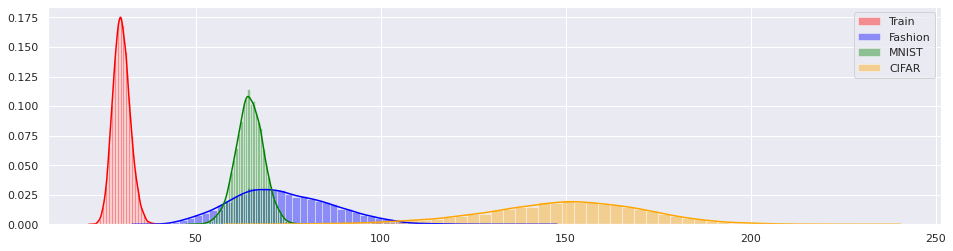

In [79]:
fig, ax = plt.subplots(1,1, figsize=(16,4))



for idx, sc in enumerate([train_score,
                             fashion_score,
                             mnist_score,
                             cifar_score]):

    sns.distplot(sc, label=LABELS[idx], color=colors[idx], ax=ax)
plt.legend()
plt.show()

**ABCD vs 1-year**

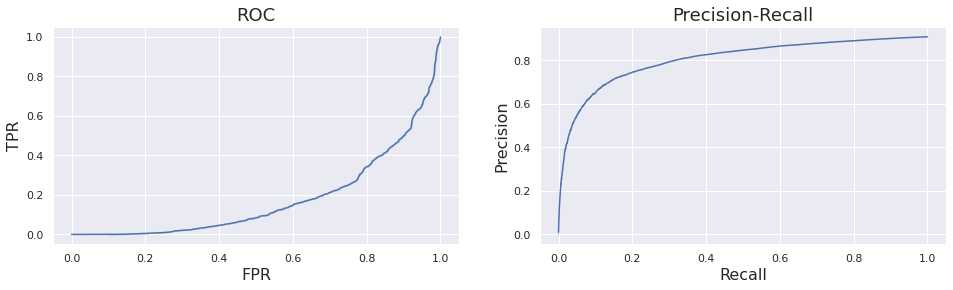

Inlier vs Outlier
----------------
ROC-AUC: 0.1765
PR-AUC: 0.8046
Avg Prec: 0.8046


In [55]:
metrics(test_score, outlier_score, plot=True, verbose=True)
plt.show()

**ABCD vs 2-year**

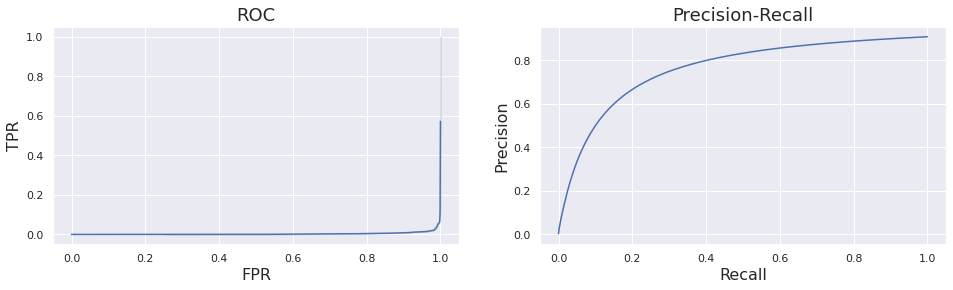

Inlier vs Outlier
----------------
ROC-AUC: 0.0032
PR-AUC: 0.7605
Avg Prec: 0.7605


In [56]:
metrics(test_score, outlier_score_2, plot=True, verbose=True)
plt.show()

## Train Data = L2-norm(Pixel Scores)

In [25]:
%%time
train_data, test_data = [], []
outlier_data_1, outlier_data_2 = [], [] 

for x, s in enumerate(SIGMAS):
#     train_data.append(tf.norm(fashion_train_dist[x] * s, axis=[1,2], ord="euclidean").numpy())
    test_data.append(tf.norm(fashion_dist[x] * s, axis=[1,2], ord="euclidean").numpy())
    outlier_data_1.append(tf.norm(mnist_dist[x] * s, axis=[1,2], ord="euclidean").numpy())
    outlier_data_2.append(tf.norm(cifar_dist[x] * s, axis=[1,2], ord="euclidean").numpy())

# train_data = np.concatenate(train_data, axis=1)
test_data = np.concatenate(test_data, axis=1)
outlier_data_1 = np.concatenate(outlier_data_1, axis=1)
outlier_data_2 = np.concatenate(outlier_data_2, axis=1)

CPU times: user 22.6 ms, sys: 13.6 ms, total: 36.2 ms
Wall time: 25.8 ms


In [27]:
# train_data.shape, 
test_data.shape, outlier_data_1.shape

((10000, 10), (10000, 10))

In [185]:
X_train, X_test =  test_data[:9000], test_data[9000:]

# UMAP

In [29]:
import umap
from sklearn.preprocessing import MinMaxScaler 

In [62]:
samples = np.concatenate((test_data, outlier_data_1, outlier_data_2))

labels = np.concatenate((np.zeros(test_data.shape[0]),
                         np.ones(outlier_data_1.shape[0]),
                         2*np.ones(outlier_data_2.shape[0])))

samples_mini = np.concatenate((test_data[9000:], outlier_data_1[9000:], outlier_data_2[9000:]))

captions_mini = np.concatenate(
    (["Fashion"]*1000,
     ["MNIST"]*1000,
     ["CIFAR"]* 1000))

captions = np.concatenate(
    (["Fashion"]*10000,
     ["MNIST"]*10000,
     ["CIFAR"]* 10000))

### Original Dataset

In [38]:
f_batch = tf.concat(fashion_test, axis=0).numpy()
m_batch = tf.concat([x for x in mnist_test], axis=0).numpy()
c_batch = tf.concat([x for x in cifar_test], axis=0).numpy()

In [42]:
og_samples = np.concatenate((f_batch, m_batch, c_batch)).squeeze()
og_samples = og_samples.reshape(og_samples.shape[0], -1)
og_samples.shape

(30000, 784)

In [44]:
%%time
reducer_og = umap.UMAP(random_state=42,
                    n_components = 3,
                    n_neighbors=100,
                    min_dist=0)
reducer_og.fit(og_samples)

CPU times: user 4min 37s, sys: 2min 20s, total: 6min 57s
Wall time: 2min 25s


UMAP(min_dist=0, n_components=3, n_neighbors=100, random_state=42)

In [85]:
%%time
embedding = reducer_og.transform(og_samples)

CPU times: user 283 ms, sys: 39 ms, total: 322 ms
Wall time: 320 ms


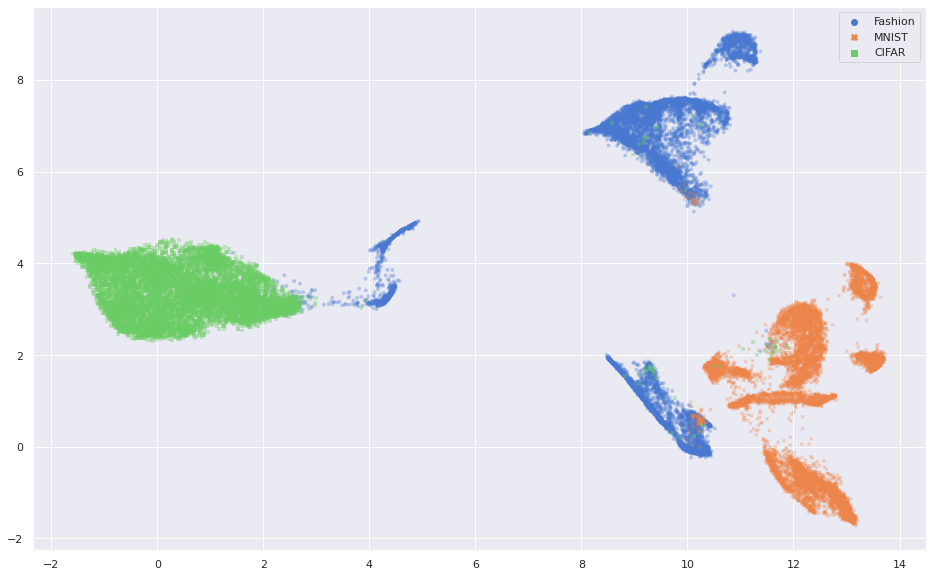

In [48]:
plt.figure(figsize=(16,10))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=captions[:], style=captions[:], s=15, alpha=0.35, palette="muted", edgecolor="none")

In [86]:
emb3d = go.Scatter3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2],
    mode="markers",
    name="Score Norms",
    marker=dict(
        size=2,
        color=labels+1,
        colorscale="Blackbody",
        opacity=0.5,
        showscale=True
    ),
    text=captions
)

In [87]:
layout = go.Layout(
    title="3D UMAP",
    autosize=False,
    width=1000,
    height=800,
#     paper_bgcolor='#F5F5F5',
#     template="plotly"
)

data=[emb3d]

fig = go.Figure(data=data, layout=layout)
fig.show()

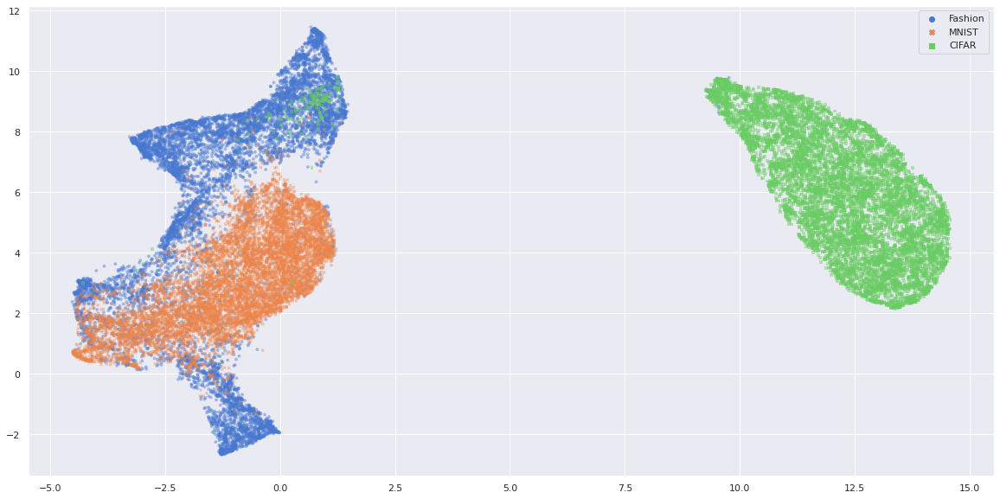

In [318]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=captions, style=captions, s=15, alpha=0.45, palette="muted", edgecolor="none")
plt.show()
# plt.close()

### Score Norms

In [64]:
%%time
reducer = umap.UMAP(random_state=42,
                    n_components = 2,
                    n_neighbors=100,
                    min_dist=0)
reducer.fit(samples)

CPU times: user 2min 26s, sys: 1min 42s, total: 4min 9s
Wall time: 1min 36s


UMAP(min_dist=0, n_neighbors=100, random_state=42)

In [65]:
%%time
embedding = reducer.transform(samples)

CPU times: user 3.35 ms, sys: 1.55 ms, total: 4.9 ms
Wall time: 3.33 ms


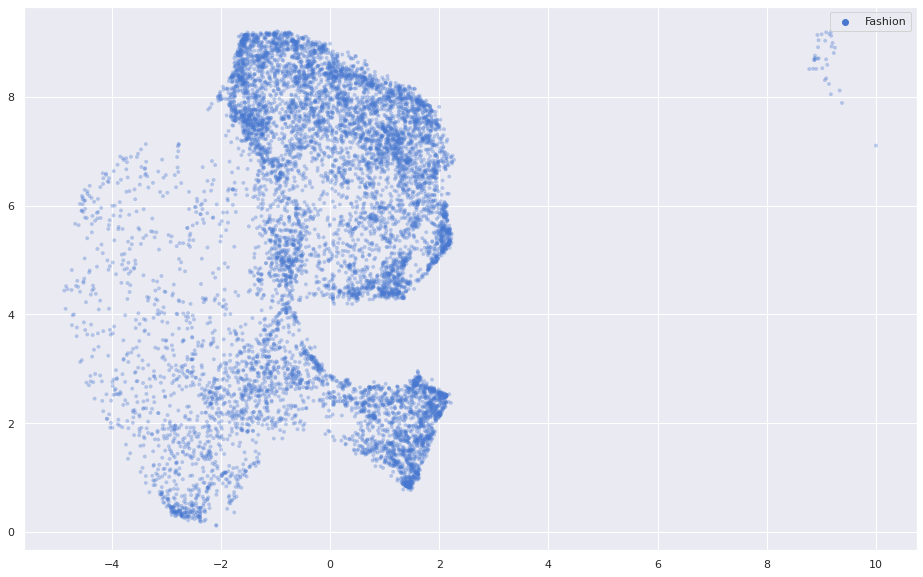

In [66]:
plt.figure(figsize=(16,10))
sns.scatterplot(x=embedding[:10000, 0], y=embedding[:10000, 1], hue=captions[:10000], style=captions[:10000], s=15, alpha=0.35, palette="muted", edgecolor="none")

In [68]:
embedding.shape

(30000, 2)

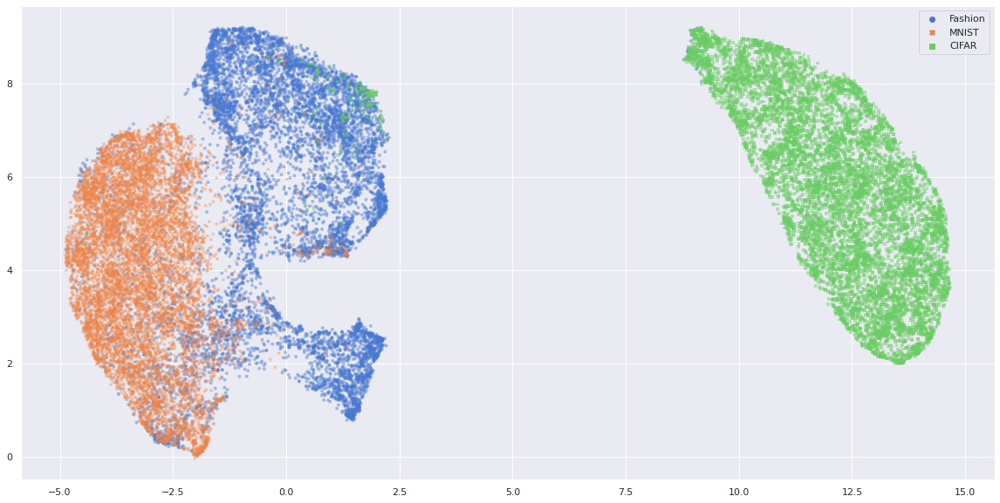

In [69]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=captions, style=captions, s=15, alpha=0.45, palette="muted", edgecolor="none")
plt.show()
# plt.close()

### Tighter Neighbourhood 

In [287]:
%%time
reducer_nn15 = umap.UMAP(random_state=42,
                    n_components = 2,
                    n_neighbors=15,
                    min_dist=0.1)
reducer_nn15.fit(samples)

CPU times: user 1min 55s, sys: 2min 7s, total: 4min 2s
Wall time: 52.2 s


UMAP(random_state=42)

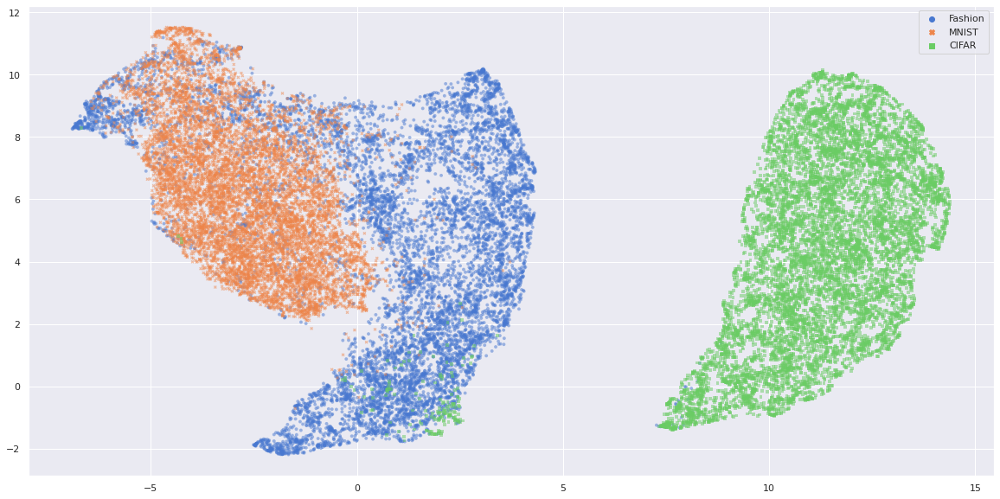

CPU times: user 940 ms, sys: 21.7 ms, total: 962 ms
Wall time: 960 ms


In [312]:
%%time
embedding = reducer_nn15.transform(samples)

plt.figure(figsize=(20,10))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=captions, style=captions, s=15, alpha=0.5, palette="muted", edgecolor="none")
plt.show()
# plt.close()

In [198]:
%%time
reducer_3d = umap.UMAP(random_state=42,
                    n_components = 3,
                    n_neighbors=100,
                    min_dist=0.1)
reducer_3d.fit(samples)

CPU times: user 2min 27s, sys: 1min 37s, total: 4min 4s
Wall time: 1min 33s


UMAP(n_components=3, n_neighbors=100, random_state=42)

In [199]:
%%time
embedding = reducer_3d.transform(samples)

CPU times: user 4.55 ms, sys: 0 ns, total: 4.55 ms
Wall time: 3.67 ms


In [200]:
emb3d = go.Scatter3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2],
    mode="markers",
    name="Score Norms",
    marker=dict(
        size=2,
        color=labels,
        colorscale="Blackbody",
        opacity=0.5,
        showscale=True
    ),
    text=captions
)

layout = go.Layout(
    title="3D UMAP",
    autosize=False,
    width=1000,
    height=800,
#     paper_bgcolor='#F5F5F5',
#     template="plotly"
)

data=[emb3d]

fig = go.Figure(data=data, layout=layout)
fig.show("notebook")

### Supervised UMAP

In [74]:
labels_train = np.concatenate((np.zeros(9000),
                         np.ones(9000),
                         2*np.ones(9000)))
labels_test = np.concatenate((np.zeros(1000),
                         np.ones(1000),
                         2*np.ones(1000)))


samples_train = np.concatenate((test_data[:9000], outlier_data_1[:9000], outlier_data_2[:9000]))
samples_test  = np.concatenate((test_data[9000:], outlier_data_1[9000:], outlier_data_2[9000:]))

samples_train_og = np.concatenate((f_batch[:9000], m_batch[:9000], c_batch[:9000])).reshape(27000,-1).squeeze()
samples_test_og  = np.concatenate((f_batch[9000:], m_batch[9000:], c_batch[9000:])).reshape(3000,-1).squeeze()

In [269]:
%%time

cheater = umap.UMAP(random_state=42,
                    n_components = 2,
                    n_neighbors=100,
                    min_dist=0.1)
cheater.fit(samples_train, y=labels_train)

CPU times: user 3min 57s, sys: 3min 34s, total: 7min 31s
Wall time: 2min 30s


UMAP(n_neighbors=100, random_state=42)

In [278]:
%%time
embedding_mini = cheater.transform(samples_test)

CPU times: user 17.9 s, sys: 461 ms, total: 18.4 s
Wall time: 7.22 s


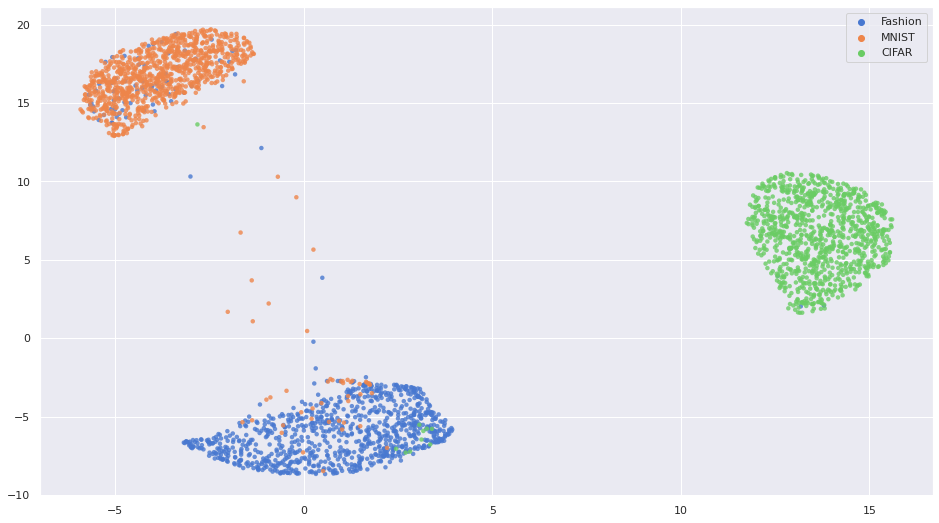

In [280]:
plt.figure(figsize=(16,9))
sns.scatterplot(x=embedding_mini[:, 0], y=embedding_mini[:, 1], hue=captions_mini, s=20, alpha=0.8, palette="muted", edgecolor="none")
plt.show()
# plt.close()

### Original Images

In [75]:
%%time

cheater = umap.UMAP(random_state=42,
                    n_components = 2,
                    n_neighbors=100,
                    min_dist=0.1)
cheater.fit(samples_train_og, y=labels_train)

CPU times: user 4min 24s, sys: 2min 10s, total: 6min 34s
Wall time: 2min 21s


UMAP(n_neighbors=100, random_state=42)

In [77]:
%%time
embedding = cheater.transform(samples_test_og)

CPU times: user 6.68 s, sys: 285 ms, total: 6.97 s
Wall time: 6.93 s


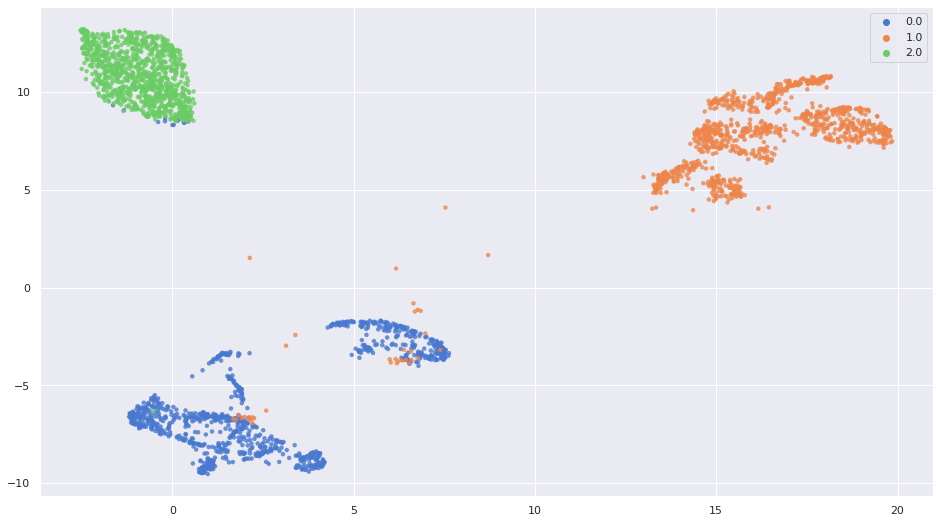

In [79]:
plt.figure(figsize=(16,9))
sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=labels_test, s=20, alpha=0.8, palette="muted", edgecolor="none")
plt.show()
# plt.close()

### OC-SVM

In [46]:
from sklearn import svm
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from helper import plot_confusion_matrix

In [47]:
%%time
clf = svm.OneClassSVM(nu=0.01, kernel="rbf")
clf.fit(X_train)

CPU times: user 156 ms, sys: 7.21 ms, total: 163 ms
Wall time: 158 ms


OneClassSVM(nu=0.01)

In [51]:
y_true = np.concatenate((np.zeros(len(X_test)),
                         np.ones(len(outlier_data_1))))

# Rescaling: 0 = inlier , 1 = outlier
test_pred = (1-clf.predict(X_test)) // (2)
outlier_pred = (1-clf.predict(outlier_data_1)) // 2
y_pred = np.concatenate((test_pred, outlier_pred))

print(classification_report(y_true, y_pred, target_names=LABELS[1:3]))

              precision    recall  f1-score   support

     Fashion       0.09      0.99      0.17      1000
       MNIST       0.97      0.02      0.04     10000

    accuracy                           0.11     11000
   macro avg       0.53      0.51      0.10     11000
weighted avg       0.89      0.11      0.05     11000



> **Low precision => Low PPV => High False Positives**

In [53]:
y_true = np.concatenate((np.zeros(len(X_test)),
                         np.ones(1000)))

# Rescaling: 0 = inlier , 1 = outlier
outlier_pred = (1-clf.predict(outlier_data_2[:1000])) // 2
y_pred = np.concatenate((test_pred, outlier_pred))

print(classification_report(y_true, y_pred, target_names=LABELS[[1,3]]))

              precision    recall  f1-score   support

     Fashion       0.96      0.99      0.98      1000
       CIFAR       0.99      0.96      0.98      1000

    accuracy                           0.98      2000
   macro avg       0.98      0.98      0.98      2000
weighted avg       0.98      0.98      0.98      2000



### Grid Search
> **Defaults w/ rbf seem to work best**

In [54]:
y_train = np.ones(len(X_train))

ocsvm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("OCSVM", svm.OneClassSVM())
])


params = {"OCSVM__nu":[0.01, 0.02, 0.001],
          "OCSVM__gamma": ["scale", "auto"],
          "OCSVM__shrinking": [True, False],
          "OCSVM__kernel": ["rbf", "poly", "sigmoid"]
         }

grid = GridSearchCV(estimator=ocsvm_clf, param_grid=params, n_jobs=12,
                    cv=10, scoring="precision", verbose=1)
print(grid)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('OCSVM', OneClassSVM())]),
             n_jobs=12,
             param_grid={'OCSVM__gamma': ['scale', 'auto'],
                         'OCSVM__kernel': ['rbf', 'poly', 'sigmoid'],
                         'OCSVM__nu': [0.01, 0.02, 0.001],
                         'OCSVM__shrinking': [True, False]},
             scoring='precision', verbose=1)


In [55]:
%%time
grid.fit(X_train, y_train)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    2.3s
[Parallel(n_jobs=12)]: Done 194 tasks      | elapsed:   14.0s


CPU times: user 1.67 s, sys: 1.79 s, total: 3.46 s
Wall time: 27.6 s


[Parallel(n_jobs=12)]: Done 360 out of 360 | elapsed:   27.3s finished


GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('OCSVM', OneClassSVM())]),
             n_jobs=12,
             param_grid={'OCSVM__gamma': ['scale', 'auto'],
                         'OCSVM__kernel': ['rbf', 'poly', 'sigmoid'],
                         'OCSVM__nu': [0.01, 0.02, 0.001],
                         'OCSVM__shrinking': [True, False]},
             scoring='precision', verbose=1)

In [91]:
grid.best_params_

{'OCSVM__gamma': 'scale',
 'OCSVM__kernel': 'rbf',
 'OCSVM__nu': 0.01,
 'OCSVM__shrinking': True}

In [59]:
%%time

clf = ocsvm_clf.set_params(**grid.best_params_)
clf.fit(train_data)

y_true = np.concatenate((np.zeros(len(X_test)),
                         np.ones(1000)))

# Rescaling: 0 = inlier , 1 = outlier
test_pred = (1-clf.predict(X_test)) // (2)
outlier_pred = (1-clf.predict(outlier_data_1[:1000])) // 2
y_pred = np.concatenate((test_pred, outlier_pred))

print(classification_report(y_true, y_pred, target_names=LABELS[[1,2]]))

              precision    recall  f1-score   support

     Fashion       0.50      0.99      0.67      1000
       MNIST       0.70      0.03      0.05      1000

    accuracy                           0.51      2000
   macro avg       0.60      0.51      0.36      2000
weighted avg       0.60      0.51      0.36      2000

CPU times: user 66.1 ms, sys: 3.63 ms, total: 69.7 ms
Wall time: 66.8 ms


Confusion matrix, without normalization
[[0.989 0.011]
 [0.974 0.026]]
Overall Accuracy: 0.5075


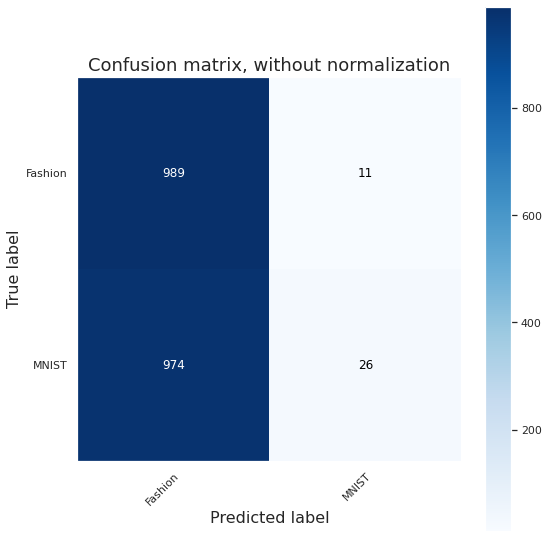

In [58]:
plot_confusion_matrix(y_true, y_pred, classes=LABELS[[1,2]])
plt.grid(False)

## GMM

In [265]:
%%time
gmm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
])

param_grid = dict(GMM__n_components = range(2,30,2),
                  GMM__covariance_type = ['full']) # Full always performs best 

grid = GridSearchCV(estimator=gmm_clf,
                    param_grid=param_grid,
                    cv=10, n_jobs=10,
                    verbose=1)

grid_result = grid.fit(X_train)

Fitting 10 folds for each of 14 candidates, totalling 140 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  31 tasks      | elapsed:    5.5s
[Parallel(n_jobs=10)]: Done 140 out of 140 | elapsed:   43.0s finished


CPU times: user 2min 2s, sys: 2min 16s, total: 4min 19s
Wall time: 49.1 s


In [266]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("-----"*15)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.273328 using {'GMM__covariance_type': 'full', 'GMM__n_components': 24}
---------------------------------------------------------------------------
-1.204247 (0.062789) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 2}
-0.453811 (0.077821) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 4}
-0.194277 (0.091547) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 6}
-0.040862 (0.085231) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 8}
0.050651 (0.088707) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
0.148047 (0.091008) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 12}
0.182662 (0.101914) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 14}
0.219243 (0.099429) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 16}
0.238536 (0.091556) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 18}
0.253051 (0.099719) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 20}
0.266

In [61]:
Best: 0.071903 using {'GMM__covariance_type': 'full', 'GMM__n_components': 10}

Best: 0.071903 using {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
---------------------------------------------------------------------------


In [96]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("-----"*15)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

Best: -13.784854 using {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
---------------------------------------------------------------------------


In [137]:
### Using BIC - Likelihoods NOT as good as CV

# bic_gmm = None
# lowest_bic = np.infty
# bics = {}
# n_components_range = range(1, 11)
# cv_types = ['spherical', 'tied', 'diag', 'full']
# scaler = StandardScaler()
# _x_train = scaler.fit_transform(X_train)

# for cv_type in cv_types:
#     for n_components in n_components_range:
#         # Fit a Gaussian mixture with EM
#         gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
#         gmm.fit(_x_train)
#         bic = gmm.bic(_x_train)
        
#         if n_components in bics:
#             bics[n_components].append(bic)
#         else:
#             bics[n_components] = [bic]
        
#         if bic < lowest_bic:
#             lowest_bic = bic
#             bic_gmm = gmm
# bic_gmm

# bics = pd.DataFrame(bics, index=['spherical', 'tied', 'diag', 'full']).T
# bics.plot(kind="bar", figsize=(20,4))

# print("Training Likelihood: {:.3f}".format(bic_gmm.score(X_train)))
# print("Testing Likelihood: {:.3f}".format(bic_gmm.score(X_test)))
# print("1-year Likelihood: {:.3f}".format(bic_gmm.score(outlier_data_1)))
# print("2-year Likelihood: {:.3f}".format(bic_gmm.score(outlier_data_2)))

In [267]:
best_params = grid.best_params_

best_gmm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
]).set_params(**best_params)

best_gmm_clf.fit(X_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('GMM', GaussianMixture(n_components=24))])

In [97]:
print("Training Likelihood: {:.3f}".format(best_gmm_clf.score(X_train)))
print("{} Likelihood: {:.3f}".format(LABELS[1], best_gmm_clf.score(X_test)))
print("{} Likelihood: {:.3f}".format(LABELS[2], best_gmm_clf.score(outlier_data_1)))
print("{} Likelihood: {:.3f}".format(LABELS[3], best_gmm_clf.score(outlier_data_2)))

Training Likelihood: 0.576
Fashion Likelihood: 0.088
MNIST Likelihood: -4.382
CIFAR Likelihood: -31.383


In [268]:
train_score = -best_gmm_clf.score_samples(X_train)
test_score = -best_gmm_clf.score_samples(X_test)
outlier_score = -best_gmm_clf.score_samples(outlier_data_1)
outlier_score_2 = -best_gmm_clf.score_samples(outlier_data_2)

In [100]:
%matplotlib inline

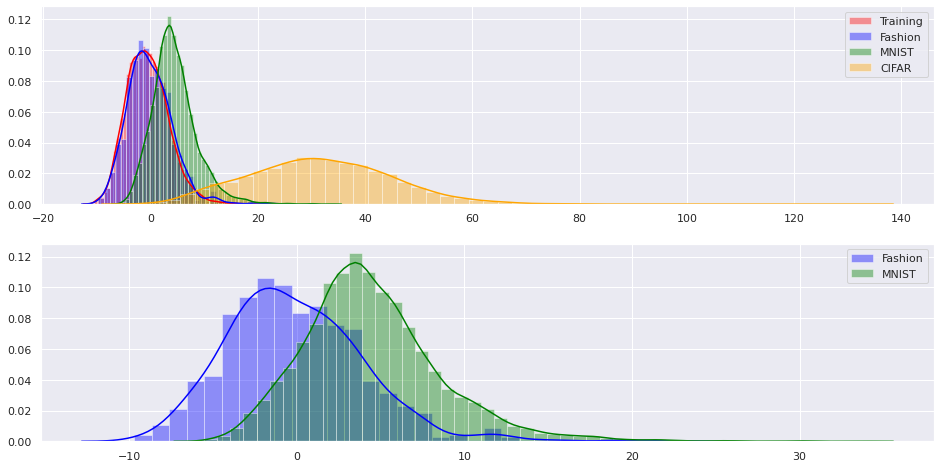

In [269]:
fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score, label="Training", color="red", ax=axs[0])
# sns.distplot(train_score, label="Training", ax=axs[1])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])


# sns.distplot(outlier_score, label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])

# sns.distplot(outlier_score_2, label=LABELS[3], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])


sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

# sns.distplot(inlier_score, color="red", label=labels[0])

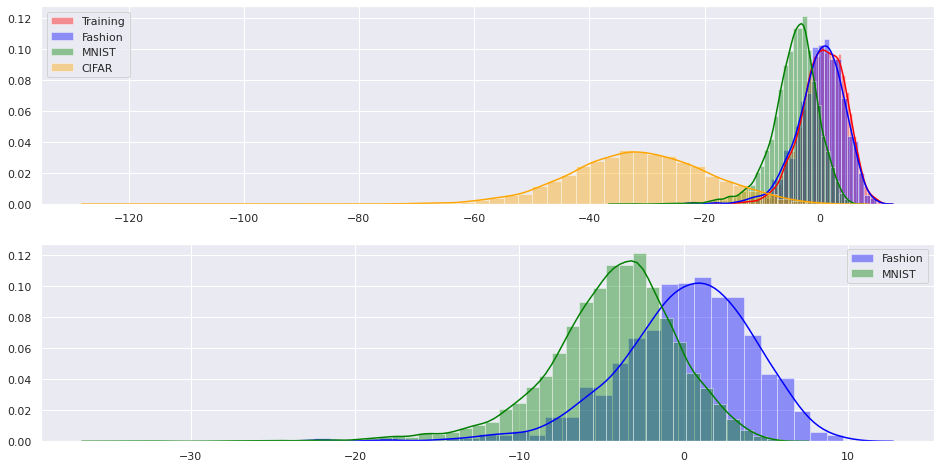

In [103]:
fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score, label="Training", color="red", ax=axs[0])
# sns.distplot(train_score, label="Training", ax=axs[1])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])


# sns.distplot(outlier_score, label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])

# sns.distplot(outlier_score_2, label=LABELS[3], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])


sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

# sns.distplot(inlier_score, color="red", label=labels[0])

**Fashion vs MNIST**

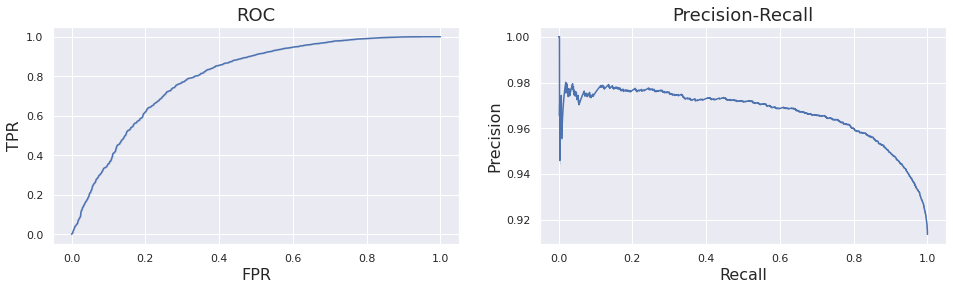

Inlier vs Outlier
----------------
ROC-AUC: 0.7971
PR-AUC: 0.9669
Avg Prec: 0.9670


In [102]:
metrics(-test_score, -outlier_score, plot=True, verbose=True)
plt.show()

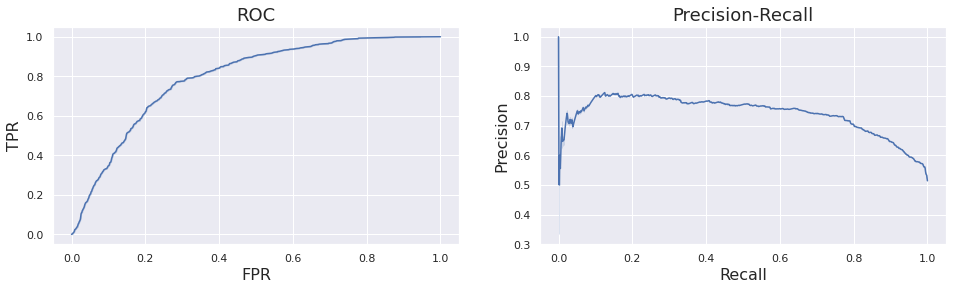

Inlier vs Outlier
----------------
ROC-AUC: 0.7935
PR-AUC: 0.7404
Avg Prec: 0.7411


In [112]:
metrics(-test_score, -outlier_score[0:-1:10], plot=True, verbose=True)
plt.show()

**Fashion vs CIFAR**

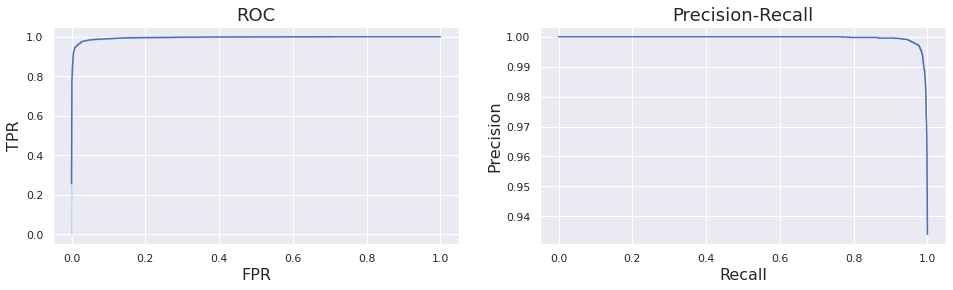

Inlier vs Outlier
----------------
ROC-AUC: 0.9959
PR-AUC: 0.9996
Avg Prec: 0.9996


In [114]:
metrics(-test_score, -outlier_score_2, plot=True, verbose=True)
plt.show()

### GMM on Original training set..?

> # TODO: TF Probability

In [118]:
import tensorflow_probability as tfp

tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions

In [453]:
X_train.shape[1]

10

In [ ]:
%%time
# Density estimation with MADE.
n = X_train.shape[0]
dims = X_train.shape[1]

made = tfb.AutoregressiveNetwork(params=2, hidden_units=[256, 256], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.Normal(loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[dims])

# Construct and fit model.
x_ = tfkl.Input(shape=(dims,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adadelta(learning_rate=0.01),
              loss=lambda _, log_prob: -log_prob)

batch_size = 64
epochs = 1000
history = model.fit(
    x=X_train,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/1000
140/140 [==============================] - 1s 5ms/step - loss: 756.4548
Epoch 2/1000
140/140 [==============================] - 1s 6ms/step - loss: 370.3130
Epoch 3/1000
140/140 [==============================] - 1s 5ms/step - loss: 254.4557
Epoch 4/1000
140/140 [==============================] - 1s 5ms/step - loss: 194.1540
Epoch 5/1000
140/140 [==============================] - 1s 6ms/step - loss: 157.7516
Epoch 6/1000
140/140 [==============================] - 1s 5ms/step - loss: 134.2502
Epoch 7/1000
140/140 [==============================] - 1s 5ms/step - loss: 118.4010
Epoch 8/1000
140/140 [==============================] - 1s 5ms/step - loss: 107.1077
Epoch 9/1000
140/140 [==============================] - 1s 6ms/step - loss: 99.6203
Epoch 10/1000
140/140 [==============================] - 1s 5ms/step - loss: 93.8666
Epoch 11/1000
140/140 [==============================] - 1s 5ms/step - loss: 90.0569
Epoch 12/1000
140/140 [==============================] - 1s 6ms/st

140/140 [==============================] - 1s 5ms/step - loss: 31.5953
Epoch 98/1000
140/140 [==============================] - 1s 5ms/step - loss: 31.2080
Epoch 99/1000
140/140 [==============================] - 1s 5ms/step - loss: 30.9484
Epoch 100/1000
140/140 [==============================] - 1s 5ms/step - loss: 30.6477
Epoch 101/1000
140/140 [==============================] - 1s 5ms/step - loss: 30.3430
Epoch 102/1000
140/140 [==============================] - 1s 5ms/step - loss: 30.0802
Epoch 103/1000
140/140 [==============================] - 1s 5ms/step - loss: 29.7162
Epoch 104/1000
140/140 [==============================] - 1s 5ms/step - loss: 29.5140
Epoch 105/1000
140/140 [==============================] - 1s 5ms/step - loss: 29.1386
Epoch 106/1000
140/140 [==============================] - 1s 6ms/step - loss: 28.9762
Epoch 107/1000
140/140 [==============================] - 1s 5ms/step - loss: 28.5981
Epoch 108/1000
140/140 [==============================] - 1s 5ms/step -

140/140 [==============================] - 1s 5ms/step - loss: 15.3814
Epoch 193/1000
140/140 [==============================] - 1s 5ms/step - loss: 15.1976
Epoch 194/1000
140/140 [==============================] - 1s 5ms/step - loss: 15.2004
Epoch 195/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.9905
Epoch 196/1000
140/140 [==============================] - 1s 5ms/step - loss: 15.0328
Epoch 197/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.9462
Epoch 198/1000
140/140 [==============================] - 1s 6ms/step - loss: 14.9138
Epoch 199/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.7595
Epoch 200/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.6818
Epoch 201/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.6750
Epoch 202/1000
140/140 [==============================] - 1s 5ms/step - loss: 14.5104
Epoch 203/1000
140/140 [==============================] - 1s 5ms/step

140/140 [==============================] - 0s 2ms/step - loss: 11.2383
Epoch 288/1000
140/140 [==============================] - 0s 2ms/step - loss: 11.2038
Epoch 289/1000
140/140 [==============================] - 0s 3ms/step - loss: 11.1880
Epoch 290/1000
140/140 [==============================] - 0s 3ms/step - loss: 11.1908
Epoch 291/1000
140/140 [==============================] - 0s 3ms/step - loss: 11.1838
Epoch 292/1000
140/140 [==============================] - 0s 2ms/step - loss: 11.1645
Epoch 293/1000
140/140 [==============================] - 0s 3ms/step - loss: 11.1109
Epoch 294/1000
140/140 [==============================] - 0s 3ms/step - loss: 11.1131
Epoch 295/1000
140/140 [==============================] - 0s 2ms/step - loss: 11.1048
Epoch 296/1000
140/140 [==============================] - 0s 2ms/step - loss: 11.0770
Epoch 297/1000
140/140 [==============================] - 0s 2ms/step - loss: 11.0813
Epoch 298/1000
140/140 [==============================] - 0s 2ms/step

140/140 [==============================] - 0s 2ms/step - loss: 10.3926
Epoch 383/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3646
Epoch 384/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.4429
Epoch 385/1000
140/140 [==============================] - 0s 3ms/step - loss: 10.3610
Epoch 386/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3984
Epoch 387/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3573
Epoch 388/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.4472
Epoch 389/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3686
Epoch 390/1000
140/140 [==============================] - 0s 3ms/step - loss: 10.3928
Epoch 391/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3312
Epoch 392/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.3865
Epoch 393/1000
140/140 [==============================] - 0s 3ms/step

140/140 [==============================] - 0s 2ms/step - loss: 10.0096
Epoch 478/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.1054
Epoch 479/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0344
Epoch 480/1000
140/140 [==============================] - 0s 3ms/step - loss: 10.1150
Epoch 481/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.9820
Epoch 482/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0790
Epoch 483/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0510
Epoch 484/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0678
Epoch 485/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0144
Epoch 486/1000
140/140 [==============================] - 0s 3ms/step - loss: 10.0248
Epoch 487/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.0391
Epoch 488/1000
140/140 [==============================] - 0s 2ms/step 

140/140 [==============================] - 0s 2ms/step - loss: 9.7170
Epoch 574/1000
140/140 [==============================] - 0s 2ms/step - loss: 9.7247
Epoch 575/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.7158
Epoch 576/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.7011
Epoch 577/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.7060
Epoch 578/1000
140/140 [==============================] - 0s 2ms/step - loss: 9.7026
Epoch 579/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.6979
Epoch 580/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.6902
Epoch 581/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.6727
Epoch 582/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.6776
Epoch 583/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.7300
Epoch 584/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.

140/140 [==============================] - 0s 3ms/step - loss: 9.3127
Epoch 670/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.3133
Epoch 671/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.3239
Epoch 672/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2831
Epoch 673/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.3409
Epoch 674/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2939
Epoch 675/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2860
Epoch 676/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2737
Epoch 677/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.3019
Epoch 678/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2552
Epoch 679/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.2952
Epoch 680/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.

140/140 [==============================] - 0s 2ms/step - loss: 8.9101
Epoch 766/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.8727
Epoch 767/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.9178
Epoch 768/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.8864
Epoch 769/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8816
Epoch 770/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8365
Epoch 771/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8897
Epoch 772/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8454
Epoch 773/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.9049
Epoch 774/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8953
Epoch 775/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.8480
Epoch 776/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.

140/140 [==============================] - 0s 2ms/step - loss: 8.6354
Epoch 862/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6209
Epoch 863/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6422
Epoch 864/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.6321
Epoch 865/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6164
Epoch 866/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6565
Epoch 867/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6198
Epoch 868/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6011
Epoch 869/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6221
Epoch 870/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6306
Epoch 871/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.6390
Epoch 872/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.

140/140 [==============================] - 0s 3ms/step - loss: 8.5448
Epoch 958/1000
140/140 [==============================] - 0s 3ms/step - loss: 8.5402
Epoch 959/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.4946
Epoch 960/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5351
Epoch 961/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5335
Epoch 962/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.4969
Epoch 963/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5222
Epoch 964/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5282
Epoch 965/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5123
Epoch 966/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.4974
Epoch 967/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.5016
Epoch 968/1000
140/140 [==============================] - 0s 2ms/step - loss: 8.

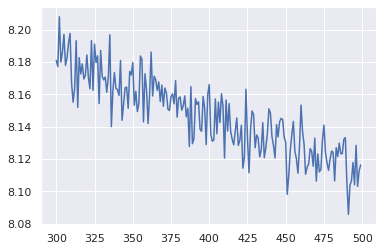

In [165]:
start_idx=300
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")

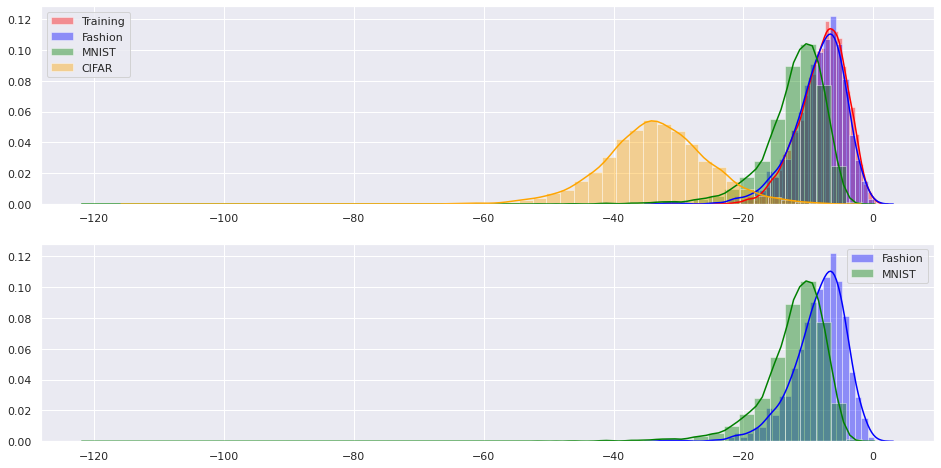

CPU times: user 1.15 s, sys: 22.9 ms, total: 1.18 s
Wall time: 1.18 s


In [170]:
%%time
train_score = distribution.log_prob(X_train, dtype=np.float32).numpy()
test_score = distribution.log_prob(X_test, dtype=np.float32).numpy()
outlier_score = distribution.log_prob(outlier_data_1, dtype=np.float32).numpy()
outlier_score_2 = distribution.log_prob(outlier_data_2, dtype=np.float32).numpy()

fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score,color=colors[0], label="Training", ax=axs[0])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])

sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

**Fashion vs MNIST**

In [171]:
metrics(-test_score, -outlier_score, plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.7477
PR-AUC: 0.9599
Avg Prec: 0.9599


## Student T's

In [180]:
# Density estimation with MADE.
n = X_train.shape[0]
made = tfb.AutoregressiveNetwork(params=2, hidden_units=[256, 256], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.StudentT(df=1, loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[10])

# Construct and fit model.
x_ = tfkl.Input(shape=(10,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adam(),
              loss=lambda _, log_prob: -log_prob)

batch_size = 25
epochs = 500
history = model.fit(
    x=X_train,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/500
360/360 [==============================] - 1s 3ms/step - loss: 25.0251
Epoch 2/500
360/360 [==============================] - 1s 2ms/step - loss: 16.5183
Epoch 3/500
360/360 [==============================] - 1s 2ms/step - loss: 14.7089
Epoch 4/500
360/360 [==============================] - 1s 2ms/step - loss: 13.6896
Epoch 5/500
360/360 [==============================] - 1s 2ms/step - loss: 13.1269
Epoch 6/500
360/360 [==============================] - 1s 2ms/step - loss: 12.8013
Epoch 7/500
360/360 [==============================] - 1s 2ms/step - loss: 12.7255
Epoch 8/500
360/360 [==============================] - 1s 2ms/step - loss: 12.4564
Epoch 9/500
360/360 [==============================] - 1s 2ms/step - loss: 12.3939
Epoch 10/500
360/360 [==============================] - 1s 2ms/step - loss: 12.2847
Epoch 11/500
360/360 [==============================] - 1s 2ms/step - loss: 12.2483
Epoch 12/500
360/360 [==============================] - 1s 2ms/step - loss: 12.1197
E

360/360 [==============================] - 1s 2ms/step - loss: 9.7538
Epoch 196/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7601
Epoch 197/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7782
Epoch 198/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7594
Epoch 199/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7570
Epoch 200/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7378
Epoch 201/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7540
Epoch 202/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7859
Epoch 203/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7242
Epoch 204/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7941
Epoch 205/500
360/360 [==============================] - 1s 2ms/step - loss: 9.6677
Epoch 206/500
360/360 [==============================] - 1s 2ms/step - loss: 9.7777
Epoch 

360/360 [==============================] - 1s 2ms/step - loss: 9.6059
Epoch 390/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5504
Epoch 391/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5844
Epoch 392/500
360/360 [==============================] - 1s 2ms/step - loss: 9.6072
Epoch 393/500
360/360 [==============================] - 1s 2ms/step - loss: 9.6147
Epoch 394/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5828
Epoch 395/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5993
Epoch 396/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5779
Epoch 397/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5904
Epoch 398/500
360/360 [==============================] - 1s 2ms/step - loss: 9.6261
Epoch 399/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5776
Epoch 400/500
360/360 [==============================] - 1s 2ms/step - loss: 9.5548
Epoch 

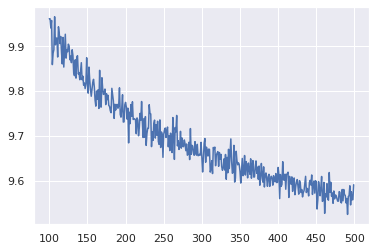

In [178]:
start_idx=100
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")

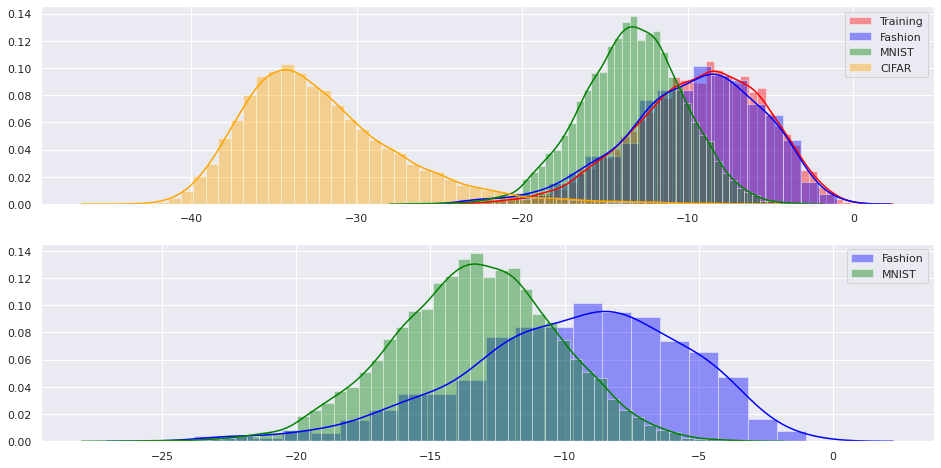

CPU times: user 1.3 s, sys: 68.4 ms, total: 1.37 s
Wall time: 1.37 s


In [179]:
%%time
train_score = distribution.log_prob(X_train, dtype=np.float32).numpy()
test_score = distribution.log_prob(X_test, dtype=np.float32).numpy()
outlier_score = distribution.log_prob(outlier_data_1, dtype=np.float32).numpy()
outlier_score_2 = distribution.log_prob(outlier_data_2, dtype=np.float32).numpy()

fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score,color=colors[0], label="Training", ax=axs[0])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])

sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

**Fashion vs MNIST**

In [171]:
metrics(-test_score, -outlier_score, plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.7477
PR-AUC: 0.9599
Avg Prec: 0.9599


## Trying a classifier

In [75]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
svm_clf =  make_pipeline(StandardScaler(), SVC(gamma='auto'))

In [78]:
labels_train = np.concatenate((np.zeros(9000),
                         np.ones(9000),
                         2*np.ones(9000)))

labels_test = np.concatenate((np.zeros(1000),
                         np.ones(1000),
                         2*np.ones(1000)))

samples_train = np.concatenate((test_data[:9000], outlier_data_1[:9000], outlier_data_2[:9000]))
samples_test  = np.concatenate((test_data[9000:], outlier_data_1[9000:], outlier_data_2[9000:]))

In [79]:
svm_clf.fit(samples_train, labels_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(gamma='auto'))])

In [84]:
test_pred = svm_clf.predict(samples_test)
test_pred[:]

array([0., 0., 0., ..., 2., 2., 2.])

In [85]:
np.unique(test_pred)

array([0., 1., 2.])

In [87]:
print(classification_report(labels_test, test_pred, target_names=LABELS[1:4]))

              precision    recall  f1-score   support

     Fashion       0.97      0.92      0.94      1000
       MNIST       0.93      0.98      0.95      1000
       CIFAR       1.00      0.99      0.99      1000

    accuracy                           0.96      3000
   macro avg       0.96      0.96      0.96      3000
weighted avg       0.96      0.96      0.96      3000



In [92]:
%%time
svm_clf = Pipeline([
    ("scaler", StandardScaler()),
    ("SVM", SVC())
])

params = {"SVM__C": [0.1, 1, 3, 10],
          "SVM__gamma": ["scale", "auto"],
          "SVM__shrinking": [True, False]
         }

grid = GridSearchCV(estimator=svm_clf, param_grid=params, n_jobs=10,
                    cv=10, scoring="accuracy", verbose=1)
print(grid)
grid_results = grid.fit(samples_train, labels_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('SVM', SVC())]),
             n_jobs=10,
             param_grid={'SVM__C': [0.1, 1, 3, 10],
                         'SVM__gamma': ['scale', 'auto'],
                         'SVM__shrinking': [True, False]},
             scoring='accuracy', verbose=1)
Fitting 10 folds for each of 16 candidates, totalling 160 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:   19.2s
[Parallel(n_jobs=10)]: Done 160 out of 160 | elapsed:  1.1min finished


CPU times: user 4.47 s, sys: 1.52 s, total: 6 s
Wall time: 1min 11s


In [95]:
print("Best: %f using %s" % (grid_results.best_score_, grid_results.best_params_))
print("-----"*15)
means = grid_results.cv_results_['mean_test_score']
stds = grid_results.cv_results_['std_test_score']
params = grid_results.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.964556 using {'SVM__C': 10, 'SVM__gamma': 'auto', 'SVM__shrinking': True}
---------------------------------------------------------------------------
0.956556 (0.004203) with: {'SVM__C': 0.1, 'SVM__gamma': 'scale', 'SVM__shrinking': True}
0.956519 (0.004224) with: {'SVM__C': 0.1, 'SVM__gamma': 'scale', 'SVM__shrinking': False}
0.956556 (0.004203) with: {'SVM__C': 0.1, 'SVM__gamma': 'auto', 'SVM__shrinking': True}
0.956519 (0.004224) with: {'SVM__C': 0.1, 'SVM__gamma': 'auto', 'SVM__shrinking': False}
0.961111 (0.002949) with: {'SVM__C': 1, 'SVM__gamma': 'scale', 'SVM__shrinking': True}
0.961111 (0.002949) with: {'SVM__C': 1, 'SVM__gamma': 'scale', 'SVM__shrinking': False}
0.961111 (0.002949) with: {'SVM__C': 1, 'SVM__gamma': 'auto', 'SVM__shrinking': True}
0.961111 (0.002949) with: {'SVM__C': 1, 'SVM__gamma': 'auto', 'SVM__shrinking': False}
0.962741 (0.002687) with: {'SVM__C': 3, 'SVM__gamma': 'scale', 'SVM__shrinking': True}
0.962741 (0.002687) with: {'SVM__C': 3, 'SVM__gamma

In [96]:
svm_clf.set_params(**grid_results.best_params_)
svm_clf.fit(samples_train, labels_train)

test_pred = svm_clf.predict(samples_test)
print(classification_report(labels_test, test_pred, target_names=LABELS[1:4]))

              precision    recall  f1-score   support

     Fashion       0.97      0.93      0.95      1000
       MNIST       0.93      0.98      0.95      1000
       CIFAR       1.00      0.99      0.99      1000

    accuracy                           0.96      3000
   macro avg       0.97      0.96      0.97      3000
weighted avg       0.97      0.96      0.97      3000



## UMAP-Reduced Training

> # *TODO: IS THIS BIASED??*

In [194]:
labels_train = np.concatenate((np.zeros(9000),
                         np.ones(9000),
                         2*np.ones(9000)))
labels_test = np.concatenate((np.zeros(1000),
                         np.ones(1000),
                         2*np.ones(1000)))


samples_train = np.concatenate((test_data[:9000], outlier_data_1[:9000], outlier_data_2[:9000]))
samples_test  = np.concatenate((test_data[9000:], outlier_data_1[9000:], outlier_data_2[9000:]))

In [402]:
%%time
# reducer_3d = umap.UMAP(random_state=42,
#                     n_components = 3,
#                     n_neighbors=50,
#                     min_dist=0.1)

reducer_3d = Pipeline([
    ("scaler", StandardScaler()),
    ("reducer", umap.UMAP(random_state=42,
                    n_components = 3,
                    n_neighbors=15,
                    min_dist=0.0))
])

reducer_3d.fit(samples_train)

CPU times: user 1min 5s, sys: 1min 5s, total: 2min 10s
Wall time: 35.6 s


Pipeline(steps=[('scaler', StandardScaler()),
                ('reducer',
                 UMAP(min_dist=0.0, n_components=3, random_state=42))])

In [403]:
%%time
embedding = reducer_3d.transform(samples_train)

CPU times: user 8.8 ms, sys: 0 ns, total: 8.8 ms
Wall time: 7.07 ms


In [404]:
emb3d = go.Scatter3d(
    x=embedding[:,0],
    y=embedding[:,1],
    z=embedding[:,2],
    mode="markers",
    name="Score Norms",
    marker=dict(
        size=2,
        color=labels_train,
        colorscale="Blackbody",
        opacity=0.5,
        showscale=True
    ),
    text=captions
)

layout = go.Layout(
    title="3D UMAP",
    autosize=False,
    width=1000,
    height=800,
#     paper_bgcolor='#F5F5F5',
#     template="plotly"
)

data=[emb3d]

fig = go.Figure(data=data, layout=layout)
fig.show("notebook")

In [405]:
%%time
X_train_embedding = reducer_3d.transform(X_train)
X_test_embedding = reducer_3d.transform(X_test)
outlier_1_embedding = reducer_3d.transform(outlier_data_1[9000:])
outlier_2_embedding = reducer_3d.transform(outlier_data_2[9000:])

CPU times: user 12.3 s, sys: 1.31 s, total: 13.6 s
Wall time: 10.4 s


## GMM

In [406]:
%%time
gmm_clf = Pipeline([
    
#     ("reducer", umap.UMAP(random_state=42,
#                     n_components = 3,
#                     n_neighbors=15,
#                     min_dist=0.1)),
#     ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
])

param_grid = dict(GMM__n_components = range(2,21,2),
                  GMM__covariance_type = ['full']) # Full always performs best 

grid = GridSearchCV(estimator=gmm_clf,
                    param_grid=param_grid,
                    cv=10, n_jobs=10,
                    verbose=1)

grid_result = grid.fit(X_train_embedding)

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  40 tasks      | elapsed:    1.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    6.9s finished


CPU times: user 39.6 s, sys: 30.5 ms, total: 39.6 s
Wall time: 8.12 s


Best: -3.536052 using {'GMM__covariance_type': 'full', 'GMM__n_components': 20}
---------------------------------------------------------------------------
-4.840419 (0.062277) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 2}
-4.409377 (0.052095) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 4}
-4.103790 (0.049149) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 6}
-3.914006 (0.027302) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 8}
-3.783521 (0.044291) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 10}
-3.747586 (0.039640) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 12}
-3.678908 (0.029297) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 14}
-3.616431 (0.053686) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 16}
-3.566460 (0.056184) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 18}
-3.536052 (0.048338) with: {'GMM__covariance_type': 'full', 'GMM__n_components': 20

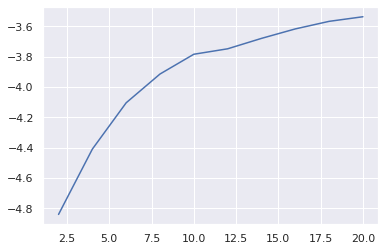

In [407]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
print("-----"*15)
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
plt.plot([p["GMM__n_components"] for p in params], means)

In [408]:
best_params = grid.best_params_

best_gmm_clf = Pipeline([
#     ("scaler", StandardScaler()),
    ("GMM", GaussianMixture())
]).set_params(**{'GMM__covariance_type': 'full', 'GMM__n_components': 20})

best_gmm_clf.fit(X_train_embedding)

print("Training Likelihood: {:.3f}".format(best_gmm_clf.score(X_train_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[1], best_gmm_clf.score(X_test_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[2], best_gmm_clf.score(outlier_1_embedding)))
print("{} Likelihood: {:.3f}".format(LABELS[3], best_gmm_clf.score(outlier_2_embedding)))

Training Likelihood: -3.507
Fashion Likelihood: -3.523
MNIST Likelihood: -6.702
CIFAR Likelihood: -84.746


In [ ]:
Training Likelihood: -2.850
Fashion Likelihood: -2.880
MNIST Likelihood: -5.961
CIFAR Likelihood: -158.041

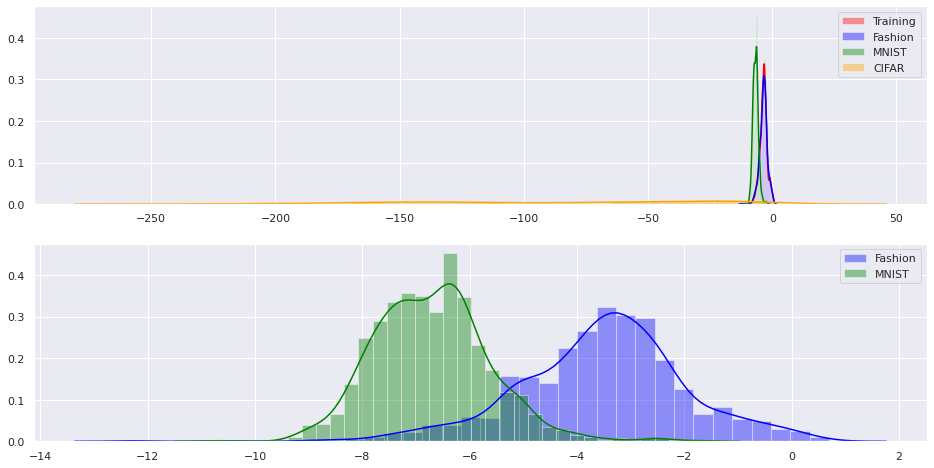

In [409]:
train_score = best_gmm_clf.score_samples(X_train_embedding)
test_score = best_gmm_clf.score_samples(X_test_embedding)
outlier_score = best_gmm_clf.score_samples(outlier_1_embedding)
outlier_score_2 = best_gmm_clf.score_samples(outlier_2_embedding)

fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score, label="Training", color="red", ax=axs[0])
# sns.distplot(train_score, label="Training", ax=axs[1])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])


# sns.distplot(outlier_score, label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])

# sns.distplot(outlier_score_2, label=LABELS[3], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])


sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1], kde=True)
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1], kde=True)

axs[0].legend()
axs[1].legend()
plt.show()

# sns.distplot(inlier_score, color="red", label=labels[0])

**Fashion vs MNIST**

In [410]:
metrics(-test_score, -outlier_score, plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.9481
PR-AUC: 0.9215
Avg Prec: 0.9222


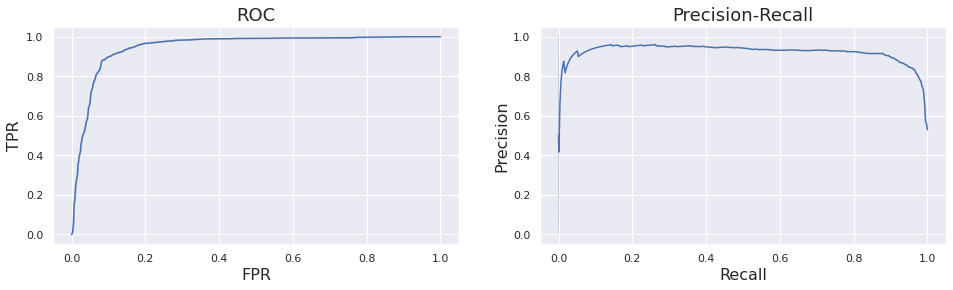

In [411]:
metrics(-test_score, -outlier_score, plot=True, verbose=False)
plt.show()

**Fashion vs CIFAR**

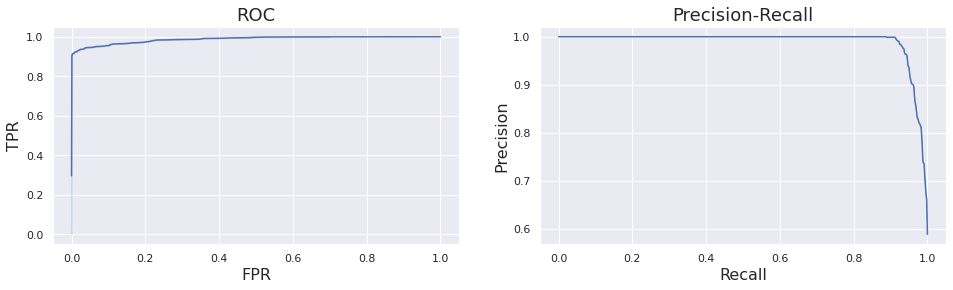

Inlier vs Outlier
----------------
ROC-AUC: 0.9873
PR-AUC: 0.9899
Avg Prec: 0.9899


In [392]:
metrics(-test_score, -outlier_score_2, plot=True, verbose=True)
plt.show()

### Flow on UMAP

In [449]:
# Density estimation with MADE.
n = X_train_embedding.shape[0]
dims = X_train_embedding.shape[1]

made = tfb.AutoregressiveNetwork(params=2, hidden_units=[128, 128], activation="elu")

distribution = tfd.TransformedDistribution(
    distribution=tfd.Normal(loc=0., scale=1.),
    bijector=tfb.MaskedAutoregressiveFlow(made),
    event_shape=[dims])

# Construct and fit model.
x_ = tfkl.Input(shape=(dims,), dtype=tf.float32)
log_prob_ = distribution.log_prob(x_)
model = tfk.Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adadelta(learning_rate=0.01),
              loss=lambda _, log_prob: -log_prob)

batch_size = 32
epochs = 1000
history = model.fit(
    x=X_train_embedding,
    y=np.zeros((n, 0), dtype=np.float32),
    batch_size=batch_size,
    epochs=epochs,
    steps_per_epoch=n//batch_size,  # Usually `n // batch_size`.
    shuffle=True,
    verbose=True)

Epoch 1/1000
140/140 [==============================] - 0s 3ms/step - loss: 28.5020
Epoch 2/1000
140/140 [==============================] - 0s 3ms/step - loss: 24.6542
Epoch 3/1000
140/140 [==============================] - 0s 3ms/step - loss: 22.2334
Epoch 4/1000
140/140 [==============================] - 0s 2ms/step - loss: 20.4668
Epoch 5/1000
140/140 [==============================] - 0s 2ms/step - loss: 18.9878
Epoch 6/1000
140/140 [==============================] - 0s 2ms/step - loss: 17.4624
Epoch 7/1000
140/140 [==============================] - 0s 2ms/step - loss: 15.8504
Epoch 8/1000
140/140 [==============================] - 0s 2ms/step - loss: 13.9550
Epoch 9/1000
140/140 [==============================] - 0s 2ms/step - loss: 12.1544
Epoch 10/1000
140/140 [==============================] - 0s 2ms/step - loss: 10.4493
Epoch 11/1000
140/140 [==============================] - 0s 3ms/step - loss: 9.1549
Epoch 12/1000
140/140 [==============================] - 0s 2ms/step - loss

140/140 [==============================] - 0s 3ms/step - loss: 5.0784
Epoch 99/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0737
Epoch 100/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0339
Epoch 101/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0519
Epoch 102/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0761
Epoch 103/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0086
Epoch 104/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0623
Epoch 105/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0386
Epoch 106/1000
140/140 [==============================] - 0s 3ms/step - loss: 5.0356
Epoch 107/1000
140/140 [==============================] - 0s 3ms/step - loss: 5.0080
Epoch 108/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0609
Epoch 109/1000
140/140 [==============================] - 0s 2ms/step - loss: 5.0

140/140 [==============================] - 0s 3ms/step - loss: 4.9494
Epoch 195/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9168
Epoch 196/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9346
Epoch 197/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9173
Epoch 198/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9810
Epoch 199/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9042
Epoch 200/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9458
Epoch 201/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9348
Epoch 202/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9247
Epoch 203/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9087
Epoch 204/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.9365
Epoch 205/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.

140/140 [==============================] - 0s 3ms/step - loss: 4.9012
Epoch 291/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8825
Epoch 292/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8926
Epoch 293/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8753
Epoch 294/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.9065
Epoch 295/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8930
Epoch 296/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8887
Epoch 297/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8911
Epoch 298/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8707
Epoch 299/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8914
Epoch 300/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8929
Epoch 301/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.

140/140 [==============================] - 0s 2ms/step - loss: 4.8422
Epoch 387/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8728
Epoch 388/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8648
Epoch 389/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8653
Epoch 390/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8532
Epoch 391/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8557
Epoch 392/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8833
Epoch 393/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8672
Epoch 394/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8539
Epoch 395/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8440
Epoch 396/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8632
Epoch 397/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.

140/140 [==============================] - 0s 3ms/step - loss: 4.8343
Epoch 483/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8354
Epoch 484/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8476
Epoch 485/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8436
Epoch 486/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8355
Epoch 487/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8502
Epoch 488/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8271
Epoch 489/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8544
Epoch 490/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8395
Epoch 491/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8391
Epoch 492/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8628
Epoch 493/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.

140/140 [==============================] - 0s 3ms/step - loss: 4.8284
Epoch 579/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8333
Epoch 580/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8237
Epoch 581/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8288
Epoch 582/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8158
Epoch 583/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8420
Epoch 584/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8219
Epoch 585/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8358
Epoch 586/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8281
Epoch 587/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8399
Epoch 588/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8008
Epoch 589/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.

140/140 [==============================] - 0s 2ms/step - loss: 4.8045
Epoch 675/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8232
Epoch 676/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8224
Epoch 677/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8042
Epoch 678/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7938
Epoch 679/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8286
Epoch 680/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.8278
Epoch 681/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8121
Epoch 682/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7965
Epoch 683/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8087
Epoch 684/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8058
Epoch 685/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.

140/140 [==============================] - 0s 2ms/step - loss: 4.8021
Epoch 771/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7838
Epoch 772/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8036
Epoch 773/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7885
Epoch 774/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7841
Epoch 775/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7886
Epoch 776/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7949
Epoch 777/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7933
Epoch 778/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7861
Epoch 779/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.8094
Epoch 780/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7724
Epoch 781/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.

140/140 [==============================] - 0s 3ms/step - loss: 4.7718
Epoch 867/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7713
Epoch 868/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7766
Epoch 869/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7605
Epoch 870/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7782
Epoch 871/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7622
Epoch 872/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7451
Epoch 873/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7948
Epoch 874/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7550
Epoch 875/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7923
Epoch 876/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7653
Epoch 877/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.

140/140 [==============================] - 0s 2ms/step - loss: 4.7645
Epoch 963/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7426
Epoch 964/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7496
Epoch 965/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7428
Epoch 966/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7544
Epoch 967/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7594
Epoch 968/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7478
Epoch 969/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7514
Epoch 970/1000
140/140 [==============================] - 0s 3ms/step - loss: 4.7457
Epoch 971/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7534
Epoch 972/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.7511
Epoch 973/1000
140/140 [==============================] - 0s 2ms/step - loss: 4.

LL: -4.7460356


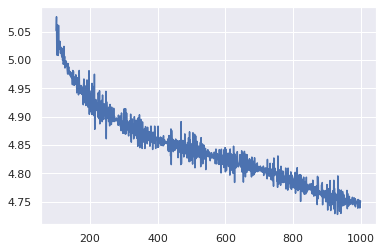

In [450]:
start_idx=100
plt.plot(range(start_idx, epochs), history.history["loss"][start_idx:])
# plt.yscale("log")
train_score = distribution.log_prob(X_train_embedding, dtype=np.float32).numpy()
print("LL:", train_score.mean())

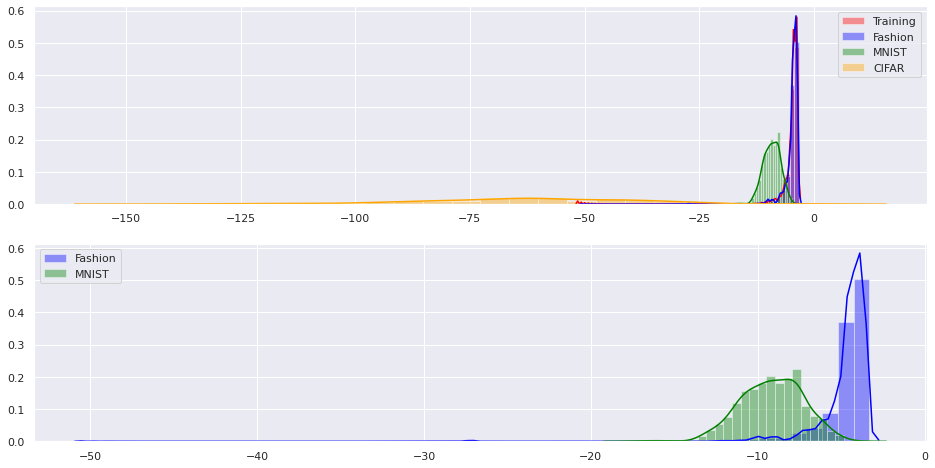

CPU times: user 2.39 s, sys: 513 ms, total: 2.91 s
Wall time: 2.9 s


In [451]:
%%time
train_score = distribution.log_prob(X_train_embedding, dtype=np.float32).numpy()
test_score = distribution.log_prob(X_test_embedding, dtype=np.float32).numpy()
outlier_score = distribution.log_prob(outlier_1_embedding, dtype=np.float32).numpy()
outlier_score_2 = distribution.log_prob(outlier_2_embedding, dtype=np.float32).numpy()

fig, axs = plt.subplots(2,1, figsize=(16,8))

sns.distplot(train_score,color=colors[0], label="Training", ax=axs[0])
sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[0])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[0])
sns.distplot(outlier_score_2, color=colors[3], label=LABELS[3], ax=axs[0])

sns.distplot(test_score, color=colors[1], label=LABELS[1], ax=axs[1])
sns.distplot(outlier_score, color=colors[2], label=LABELS[2], ax=axs[1])

axs[0].legend()
axs[1].legend()
plt.show()

**Fashion vs MNIST**

In [452]:
metrics(-test_score, -outlier_score, plot=False, verbose=True)
plt.show()

Inlier vs Outlier
----------------
ROC-AUC: 0.9680
PR-AUC: 0.9419
Avg Prec: 0.9424


**AdaDelta w/ lr=0.01, 128bs, 1000 epcohs**

ROC-AUC: 0.9683
PR-AUC: 0.9425

Avg Prec: 0.9430